# Imports

In [ ]:
!pip install --upgrade pyalgotrading

In [1]:
from pyalgotrading.algobulls import AlgoBullsConnection

# Connection

In [2]:
connection = AlgoBullsConnection()

In [3]:
connection.get_token_url()

Please login to this URL to get your unique token: https://app.algobulls.com/settings?section=developerOptions


In [4]:
API_TOKEN = "33018c2bbd554247ef271b945a42450a46bd6b8f"
connection.set_access_token(API_TOKEN)

# Strategy Creation

## Import Strategy from pyaglostrategypool

In [ ]:
! wget -O options_bear_put_ladder.py https://raw.githubusercontent.com/algobulls/pyalgostrategypool/master/pyalgostrategypool/options_bear_put_ladder.py
! sed -i '1s/^/from pyalgotrading.strategy import StrategyBase\n/' options_bear_put_ladder.py

In [5]:
from options_bear_put_ladder import StrategyOptionsBearPutLadder as strategy_cls

In [6]:
response = connection.create_strategy(strategy_cls, overwrite=True)
response

{'message': 'Strategy saved successfully',
 'cstcId': 130237,
 'strategyId': '316c43def57d465cae420ac9ea0c7de2'}

In [7]:
strategy = response['strategyId']

# Strategy Testing

## Instruments Searching (optional)

In [8]:
instrument = connection.search_instrument('NIFTY BANK', exchange='NSE')
instrument

[{'id': 5669, 'value': 'NSE:NIFTY BANK'}]

## Setup Parameters

In [9]:
parameters = {
    'LEG_ONE_NUMBER_OF_STRIKES': 0,
    'LEG_ONE_STRIKE_DIRECTION': 1,
    'LEG_ONE_TRADING_SYMBOL_SUFFIX': 2,
    'LEG_ONE_TRANSACTION_TYPE': 1,
    
    'LEG_THREE_NUMBER_OF_STRIKES': 2,
    'LEG_THREE_STRIKE_DIRECTION': 0,
    'LEG_THREE_TRADING_SYMBOL_SUFFIX': 2,
    'LEG_THREE_TRANSACTION_TYPE': 2,
    
    'LEG_TWO_NUMBER_OF_STRIKES': 2,
    'LEG_TWO_STRIKE_DIRECTION': 2,
    'LEG_TWO_TRADING_SYMBOL_SUFFIX': 2,
    'LEG_TWO_TRANSACTION_TYPE': 1
}

In [10]:
initial_virtual_funds = 1450000     # in Rupees

## Backtesting

### Start

In [11]:
connection.backtest(
    strategy=strategy, 
    start='2021-08-01 09:15 +0530', 
    end='2023-07-31 15:30 +0530', 
    instrument='NSE:NIFTY BANK', 
    lots=10,
    parameters=parameters, 
    candle='1 hour',
    initial_funds_virtual=initial_virtual_funds

)


Starting the strategy 'Options Bear Put Ladder Template' in BACKTESTING mode...
╒═════════════════════════╤════════════════════════════════════════╕
│ Config                  │ Value                                  │
╞═════════════════════════╪════════════════════════════════════════╡
│ Strategy Name           │ Options Bear Put Ladder Template       │
├─────────────────────────┼────────────────────────────────────────┤
│ Trading Type            │ BACKTESTING                            │
├─────────────────────────┼────────────────────────────────────────┤
│ Instrument(s)           │ ['NSE:NIFTY BANK']                     │
├─────────────────────────┼────────────────────────────────────────┤
│ Quantity/Lots           │ 10                                     │
├─────────────────────────┼────────────────────────────────────────┤
│ Start Timestamp         │ 2021-08-01 09:15:00+05:30              │
├─────────────────────────┼────────────────────────────────────────┤
│ End Timestamp       

### Status

In [12]:
connection.get_backtesting_job_status(strategy)

{'message': 'STARTING', 'status': 1}

### Logs

In [13]:
logs = connection.get_backtesting_logs(strategy)

Looking for a dedicated virtual server to execute your strategy... (9)

Execution Progress:   0%|          | 0/63008100.0 [00:00<?]

In [15]:
print(logs)

[2023-08-24 14:32:16+00:00] Logs not available yet. Please retry in sometime.
[2023-08-24 14:32:16+00:00] Logs not available yet. Please retry in sometime.
[2023-08-24 14:32:16+00:00] Logs not available yet. Please retry in sometime.
[2023-08-24 20:02:11] Performing sanity checks on cfg strategy_parameters, setting up required data structures...
[2023-08-24 20:02:11] Sanity checks on cfg successful.
[2023-08-24 20:02:11] Currency set to "INR"
[2023-08-24 20:02:11] Setting up broker connection...
[2023-08-24 20:02:13] Broker connection has been setup successfully.
[2023-08-24 20:02:13] (NSE_IDX) Funds available in client's ABVIRTUALBROKER account is : INR '1450000.00'
[2023-08-24 20:02:13] 
########################################
 INITIALIZING ALGOBULLS CORE (v3.3.0)... 
########################################
[2023-08-24 20:02:13] Welcome ALGOBULLS VIRTUAL USER!
[2023-08-24 20:02:13] Reading strategy...
[2023-08-24 20:02:13] Entering Backtesting mode. Henceforth, all timestamps will 

### Stop

In [16]:
connection.stop_backtesting_job(strategy)

Stopping BACKTESTING job... Success.


### Profit and Loss Reports

In [17]:
pnl_reports = connection.get_backtesting_report_pnl_table(strategy, country='India')
pnl_reports

,instrument_segment,instrument_tradingsymbol,entry_timestamp,entry_transaction_type,entry_quantity,entry_currency,entry_price,exit_timestamp,exit_transaction_type,exit_quantity,exit_currency,exit_price,pnl_absolute,pnl_cumulative_absolute
0,NFO,BANKNIFTY05AUG2134800PE,2021-08-01 09:15:00+05:30,SELL,150,₹,389.00,2021-08-01 15:30:00+05:30,BUY,150,₹,389.00,0.0,0.0
1,NFO,BANKNIFTY05AUG2134800PE,2021-08-01 09:15:00+05:30,BUY,150,₹,389.00,2021-08-01 15:30:00+05:30,SELL,150,₹,389.00,0.0,0.0
2,NFO,BANKNIFTY05AUG2134600PE,2021-08-01 09:15:00+05:30,BUY,150,₹,287.45,2021-08-01 15:30:00+05:30,SELL,150,₹,287.45,0.0,0.0
3,NFO,BANKNIFTY05AUG2135000PE,2021-08-02 09:15:00+05:30,SELL,150,₹,425.65,2021-08-02 15:30:00+05:30,BUY,150,₹,387.90,5662.5,5662.5
4,NFO,BANKNIFTY05AUG2135000PE,2021-08-02 09:15:00+05:30,BUY,150,₹,425.65,2021-08-02 15:30:00+05:30,SELL,150,₹,387.90,-5662.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,NFO,BANKNIFTY03AUG2345800PE,2023-07-28 09:15:00+05:30,BUY,150,₹,260.00,2023-07-28 15:30:00+05:30,SELL,150,₹,400.05,21007.5,-1210852.5
1455,NFO,BANKNIFTY03AUG2345600PE,2023-07-28 09:15:00+05:30,BUY,150,₹,239.95,2023-07-28 15:30:00+05:30,SELL,150,₹,284.45,6675.0,-1204177.5
1456,NFO,BANKNIFTY03AUG2345700PE,2023-07-31 09:15:00+05:30,SELL,150,₹,372.00,2023-07-31 15:30:00+05:30,BUY,150,₹,372.00,0.0,-1204177.5
1457,NFO,BANKNIFTY03AUG2345700PE,2023-07-31 09:15:00+05:30,BUY,150,₹,372.00,2023-07-31 15:30:00+05:30,SELL,150,₹,372.00,0.0,-1204177.5


### Statistics Reports

#### Statistics

In [18]:
connection.get_backtesting_report_statistics(strategy, initial_funds=initial_virtual_funds)

Generating Statistics for already fetched P&L data...


/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/pyalgotrading/algobulls/connection.py:482: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _returns_df['entry_timestamp'] = _returns_df['entry_timestamp'].dt.tz_localize(None)  # Note: Quantstats has a bug. It doesn't accept the df index, which is set below, with timezone. Hence, we have to drop the timezone info


                    Strategy
------------------  ----------
Start Period        2021-08-01
End Period          2023-07-31
Risk-Free Rate      0.0%
Time in Market      100.0%

Cumulative Return   -83.05%
CAGR﹪              -58.88%

Sharpe              0.95
Prob. Sharpe Ratio  98.93%
Sortino             3.85
Sortino/√2          2.72
Omega               1.48

Max Drawdown        -98.67%
Longest DD Days     585

Gain/Pain Ratio     0.48
Gain/Pain (1M)      4.99

Payoff Ratio        1.95
Profit Factor       1.48
Common Sense Ratio  1.78
CPC Index           1.24
Tail Ratio          1.2
Outlier Win Ratio   4.92
Outlier Loss Ratio  3.82

MTD                 -8.4%
3M                  -30.09%
6M                  -54.23%
YTD                 27.08%
1Y                  -59.25%
3Y (ann.)           -58.88%
5Y (ann.)           -58.88%
10Y (ann.)          -58.88%
All-time (ann.)     -58.88%

Avg. Drawdown       -71.45%
Avg. Drawdown Days  362
Recovery Factor     -0.84
Ulcer Index         0.6
Serenity I

#### Quantstats Full Report

Generating Statistics for already fetched P&L data...


/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/pyalgotrading/algobulls/connection.py:482: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _returns_df['entry_timestamp'] = _returns_df['entry_timestamp'].dt.tz_localize(None)  # Note: Quantstats has a bug. It doesn't accept the df index, which is set below, with timezone. Hence, we have to drop the timezone info


                           Strategy
-------------------------  ----------
Start Period               2021-08-01
End Period                 2023-07-31
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -83.05%
CAGR﹪                     -58.88%

Sharpe                     0.95
Prob. Sharpe Ratio         98.93%
Smart Sharpe               0.85
Sortino                    3.85
Smart Sortino              3.43
Sortino/√2                 2.72
Smart Sortino/√2           2.43
Omega                      1.48

Max Drawdown               -98.67%
Longest DD Days            585
Volatility (ann.)          635.9%
Calmar                     -0.6
Skew                       15.62
Kurtosis                   301.58

Expected Daily %           -0.36%
Expected Monthly %         -7.13%
Expected Yearly %          -44.65%
Kelly Criterion            13.99%
Risk of Ruin               0.0%
Daily Value-at-Risk        -63.48%
Expected Shortfall (cVaR)  -63.48%

Max Consecutiv

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2021-12-23,2022-12-21,2023-07-31,585,-98.669678,-92.336024
2,2021-08-04,2021-10-28,2021-12-21,139,-44.229907,-33.927927


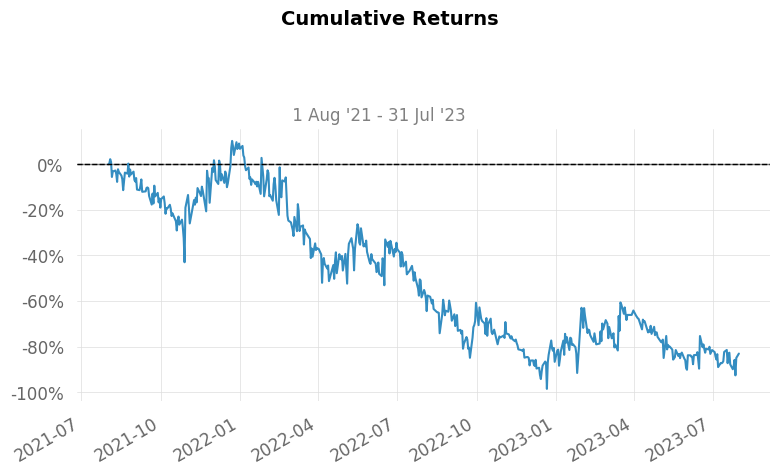

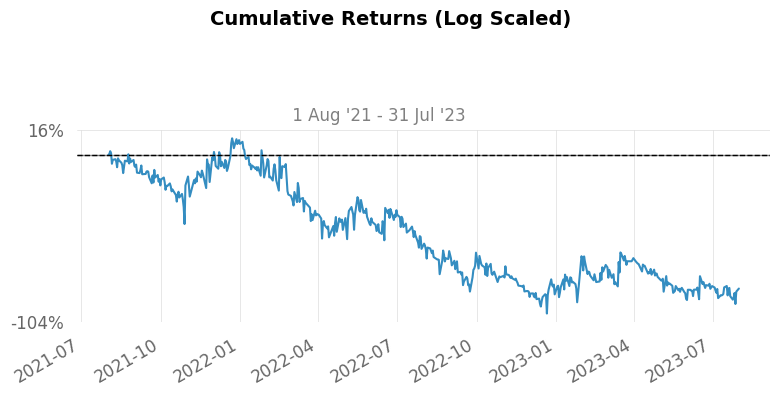

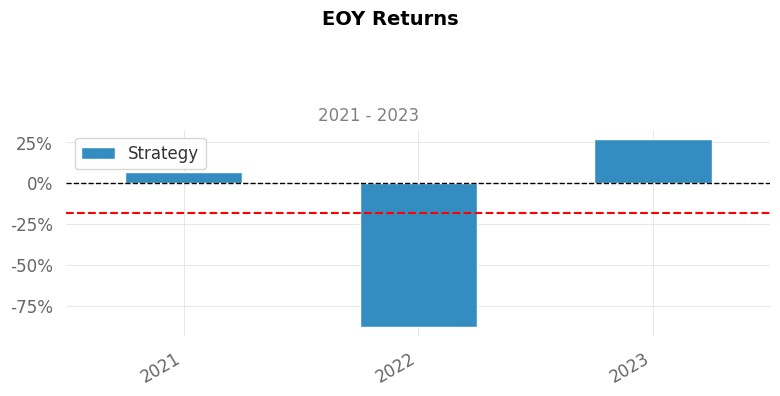

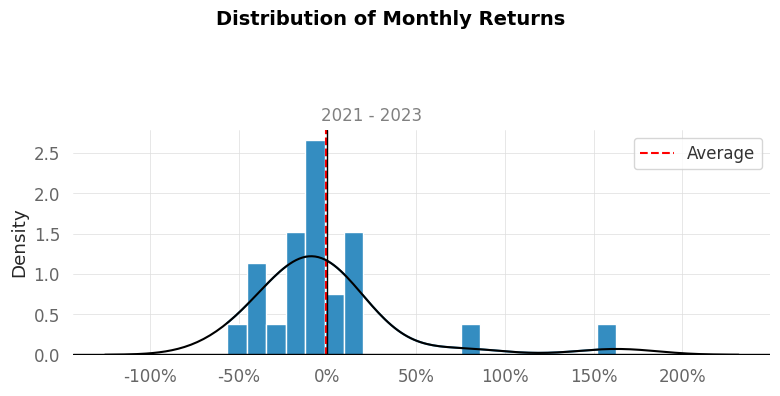

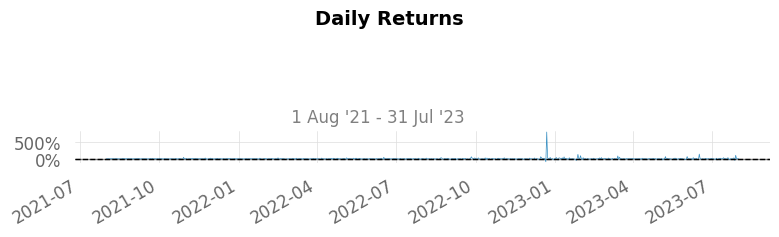

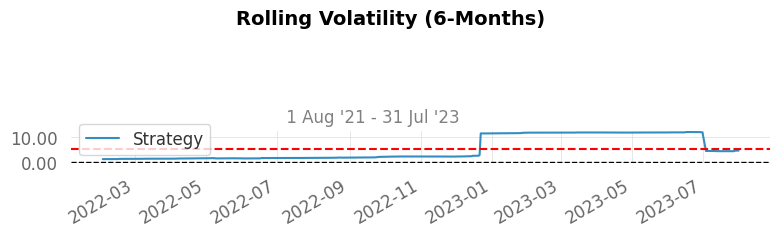

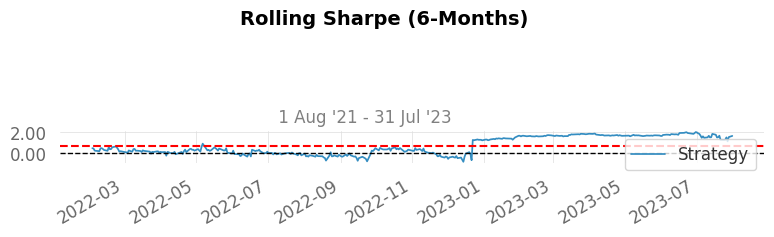

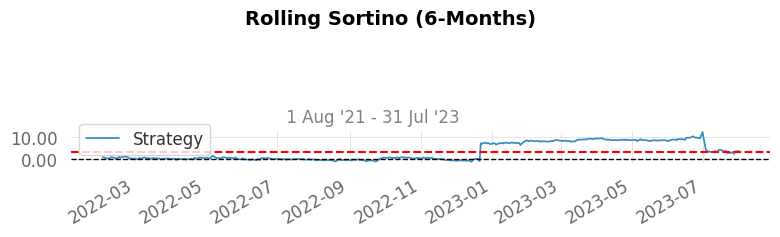

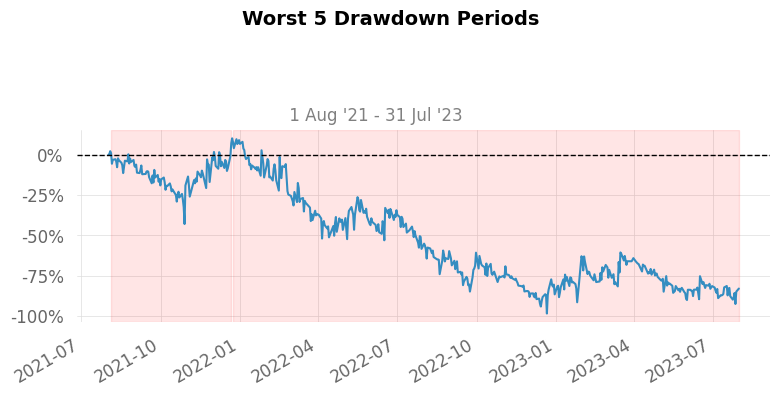

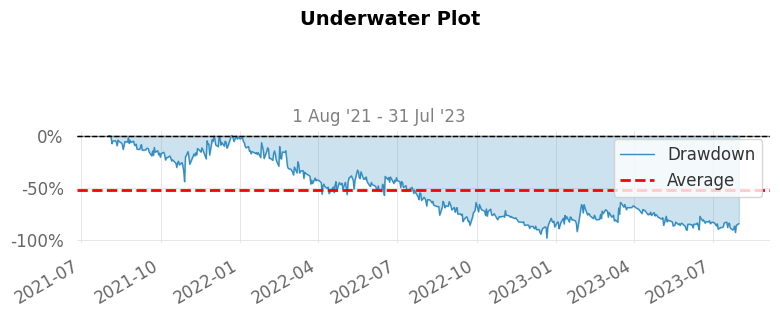

/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/quantstats/stats.py:983: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  returns = returns.pivot('Year', 'Month', 'Returns').fillna(0)


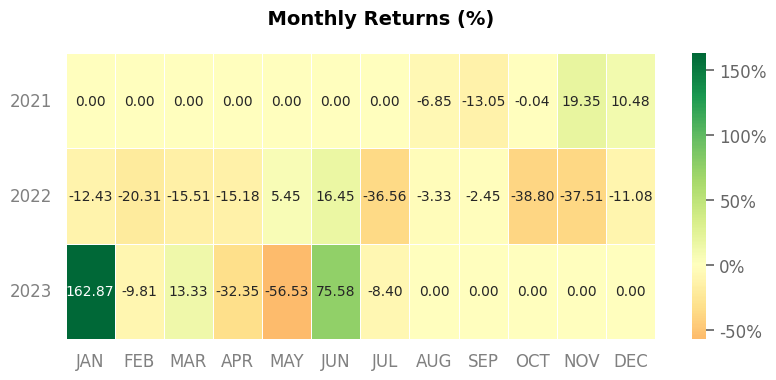

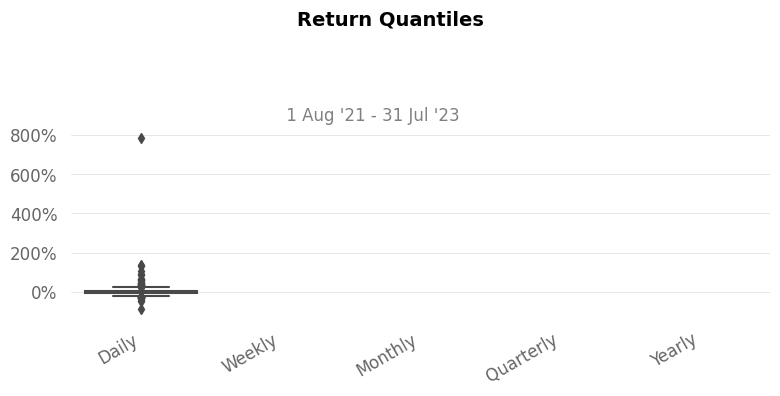

/home/prithvirajgotepatil/projects/venvs/jupyter_us_env/lib/python3.10/site-packages/quantstats/stats.py:983: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  returns = returns.pivot('Year', 'Month', 'Returns').fillna(0)


In [19]:
connection.get_backtesting_report_statistics(strategy, report='full', html_dump=True, initial_funds=initial_virtual_funds)

### Order History

In [20]:
order_history = connection.get_backtesting_report_order_history(strategy)
print(order_history)



+----------------------------------------+---------------------------+----------------------------------+------+
| INST                                   | TIME                      | ID                               | TT   |
|----------------------------------------+---------------------------+----------------------------------+------|
| NSE_FO:BANKNIFTY05AUG2134600PE [LOCAL] | 2021-08-01 09:15:00+05:30 | f6d36ab527c443cf94473ea094f9667b | BUY  |
+----------------------------------------+---------------------------+----------------------------------+------+
+----+---------------------------+------------------------+-------+
|    | TIME                      | STATE                  | MSG   |
|----+---------------------------+------------------------+-------|
|  0 | 2021-08-01 09:15:00+05:30 | PUT ORDER REQ RECEIVED |       |
|  1 | 2021-08-01 09:15:00+05:30 | VALIDATION PENDING     |       |
|  2 | 2021-08-01 09:15:00+05:30 | OPEN PENDING           |       |
|  3 | 2021-08-01 09:15:0

---

## Papertrading

### Start

In [ ]:
connection.papertrade(
    strategy=strategy, 
    start='9:15 +0530', 
    end='15:00 +0530',  
    instruments='NSE:SBIN', 
    lots=5,
    parameters=parameters, 
    candle='1 minute',
)

### Status

In [ ]:
connection.get_papertrading_job_status(strategy)

### Logs

In [ ]:
logs = connection.get_papertrading_logs(strategy)
print(logs)

### Stop

In [ ]:
connection.stop_papertrading_job(strategy)

### Profit and Loss Reports (Paper Trading)

In [ ]:
pnl_reports = connection.get_papertrading_report_pnl_table(strategy)
pnl_reports

### Statistics Reports (Paper Trading)

#### Statistics

In [ ]:
connection.get_papertrading_report_statistics(strategy)

#### Quantstats Full Report

In [ ]:
connection.get_papertrading_report_statistics(strategy, mode='quantstats', report='full', html_dump=True)

### Order History (Paper Trading)

In [ ]:
order_history = connection.get_papertrading_report_order_history(strategy)
print(order_history)

---

## Live Trading (Real Trading)

### Start

In [ ]:
connection.realtrade(
    strategy=strategy, 
    start='8:00 +0530', 
    end='15:00 +0530', 
    instruments='NSE:SBIN', 
    lots=5,
    parameters=parameters, 
    candle='1 minute',
    broking_id=73,
    broking_details=broking_details
)

### Status

In [ ]:
connection.get_realtrading_job_status(strategy)

### Logs

In [ ]:
logs = connection.get_realtrading_logs(strategy)
print(logs)

### Stop

In [ ]:
connection.stop_realtrading_job(strategy)

### Profit and Loss Reports (Live Trading)

In [ ]:
pnl_reports = connection.get_realtrading_report_pnl_table(strategy)
pnl_reports

### Statistics Reports (Live Trading)

#### Statistics

In [ ]:
connection.get_realtrading_report_statistics(strategy)

#### Quantstats Full Report

In [ ]:
connection.get_realtrading_report_statistics(strategy, mode='quantstats', report='full', html_dump=True)